In [42]:
import os
import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import CocoDetection
import json
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

%matplotlib inline

print(torch.cuda.is_available())
device = torch.device('cuda')

True


In [43]:
# Path to the training dataset annotations in COCO format
train_annotations_path = r"C:\Users\gokul\Desktop\CSIS_SS23\F_RCNN_dataset\train\train_annotations.json"

# Path to the validation dataset annotations in COCO format
val_annotations_path = r"C:\Users\gokul\Desktop\CSIS_SS23\F_RCNN_dataset\val\val_annotations.json"

# Path to the root directory of the training images
train_image_root = r"C:\Users\gokul\Desktop\CSIS_SS23\F_RCNN_dataset\train\images"

# Path to the root directory of the validation images
val_image_root = r"C:\Users\gokul\Desktop\CSIS_SS23\F_RCNN_dataset\val\images"

In [44]:
def custom_collate_fn(batch):
    images = []
    targets = []
    for img, target in batch:
        # Convert PIL image or ndarray to tensor
        if not isinstance(img, torch.Tensor):
            img = transforms.ToTensor()(img)
        images.append(img)
        targets.append(target)
    return images, targets

In [45]:
# mean = (0.5,0.5,0.5)
# std = (0.5,0.5,0.5)
# sharpness_factor = 2
# transform = transforms.Compose([
#                                 transforms.Resize((224,224)),
#                                 transforms.RandomAdjustSharpness(sharpness_factor),
#                                 transforms.RandomHorizontalFlip(),
#                                 transforms.ColorJitter(brightness=0.23,
#                                                        contrast=0.39,
#                                                        saturation=0.22,
#                                                        hue=0.1),
#                                 transforms.GaussianBlur(kernel_size=3),
#                                 transforms.RandomPerspective(),
#                                 transforms.ToTensor(),
#                                 transforms.Normalize(mean,std)
# ])
# Create the train and validation datasets 
train_dataset = CocoDetection(root=train_image_root, annFile=train_annotations_path)
val_dataset = CocoDetection(root=val_image_root, annFile=val_annotations_path)

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [47]:
train_mean = []
train_std = []
for img, _ in train_dataset:
    img = np.array(img)
    train_mean.append(np.mean(img, axis=(1, 2)))
    train_std.append(np.std(img, axis=(1, 2)))

# Calculate the mean and std for the validation dataset
val_mean = []
val_std = []
for img, _ in val_dataset:
    img = np.array(img)
    val_mean.append(np.mean(img, axis=(1, 2)))
    val_std.append(np.std(img, axis=(1, 2)))

# Convert the lists of mean and std to NumPy arrays
train_mean = np.array(train_mean)
train_std = np.array(train_std)
val_mean = np.array(val_mean)
val_std = np.array(val_std)

# Convert the NumPy arrays to tensors
train_mean = torch.tensor(train_mean)
train_std = torch.tensor(train_std)
val_mean = torch.tensor(val_mean)
val_std = torch.tensor(val_std)

# Define the new transformation using dynamic mean and std
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(train_mean.mean(dim=0).tolist(), train_std.mean(dim=0).tolist())
])

# Update the train_dataset and val_dataset with the new transform
train_dataset.transform = transform
val_dataset.transform = transform

In [56]:
# Define the batch size for training and validation
batch_size = 1

# Create the data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0, collate_fn=custom_collate_fn)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0, collate_fn=custom_collate_fn)

In [57]:
print('Train dataset length:', len(train_dataset))
print('Validation dataset length:', len(val_dataset))

Train dataset length: 1000
Validation dataset length: 200


In [58]:
model = fasterrcnn_resnet50_fpn(pretrained = True)
num_classes = 2  # window and background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
model.to(device)
print('Model Loaded')

Model Loaded


In [59]:
# Define the optimizer and learning rate
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.0005)

# Define the learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# Define the loss function
criterion = torch.nn.CrossEntropyLoss()

# Define the number of epochs for training
num_epochs = 20
model_path = r'C:\Users\gokul\Desktop\CSIS_SS23\F_RCNN_dataset\F_RCNN_weightfile\FRCNN_model_4.pt'
model.train()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [60]:
import itertools

for images, targets in itertools.islice(train_loader, 5):
    images = list(image.to(device) for image in images)

    for annotations in targets:
        for annotation in annotations:
            bbox = annotation['bbox']
            print(bbox)

[0.5852076124567474, 0.19290657439446368, 0.08261245674740492, 0.1386966551326413]
[0.905060553633218, 0.2301038062283737, 0.07612456747404839, 0.1320645905420992]
[0.9483131487889274, 0.5940023068050749, 0.05168685121107264, 0.16753171856978089]
[0.6018598615916955, 0.5870818915801614, 0.0912629757785467, 0.18800461361014997]
[0.04476643598615917, 0.5346020761245674, 0.11029411764705882, 0.17762399077277968]
[0.24134948096885814, 0.1438869665513264, 0.08369377162629757, 0.14878892733564017]
[0.019247404844290657, 0.10668973471741638, 0.09904844290657439, 0.16407151095732408]
[0.531875, 0.32166666666666666, 0.27312500000000006, 0.5416666666666666]
[0.845625, 0.3025, 0.15437500000000004, 0.64]
[0.32264957264957267, 0.09683426443202979, 0.1388888888888889, 0.36685288640595903]
[0.3269230769230769, 0.5642458100558659, 0.13995726495726496, 0.3873370577281192]
[0.6335470085470085, 0.5344506517690876, 0.21581196581196582, 0.3109869646182495]
[0.6666666666666666, 0.08007448789571694, 0.131410

[0.11752136752136752, 0.06890130353817504, 0.08867521367521367, 0.3426443202979516]
Rectangle(xy=(75.2137, 44.0968), width=56.7521, height=219.292, angle=0)
[0.2724358974358974, 0.08007448789571694, 0.07264957264957267, 0.3035381750465549]
Rectangle(xy=(174.359, 51.2477), width=46.4957, height=194.264, angle=0)
[0.42735042735042733, 0.10242085661080075, 0.10256410256410259, 0.3202979515828678]
Rectangle(xy=(273.504, 65.5493), width=65.641, height=204.991, angle=0)
[0.7029914529914529, 0.0931098696461825, 0.09615384615384626, 0.32774674115456237]
Rectangle(xy=(449.915, 59.5903), width=61.5385, height=209.758, angle=0)
[0.6848290598290598, 0.5083798882681564, 0.13247863247863245, 0.3947858472998138]
Rectangle(xy=(438.291, 325.363), width=84.7863, height=252.663, angle=0)
[0.9540598290598291, 0.1303538175046555, 0.04487179487179482, 0.3054003724394786]
Rectangle(xy=(610.598, 83.4264), width=28.7179, height=195.456, angle=0)


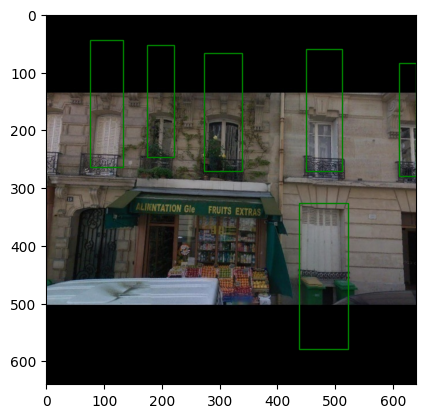

[0.32264957264957267, 0.09683426443202979, 0.1388888888888889, 0.36685288640595903]
Rectangle(xy=(206.496, 61.9739), width=88.8889, height=234.786, angle=0)
[0.3269230769230769, 0.5642458100558659, 0.13995726495726496, 0.3873370577281192]
Rectangle(xy=(209.231, 361.117), width=89.5726, height=247.896, angle=0)
[0.6335470085470085, 0.5344506517690876, 0.21581196581196582, 0.3109869646182495]
Rectangle(xy=(405.47, 342.048), width=138.12, height=199.032, angle=0)
[0.6666666666666666, 0.08007448789571694, 0.1314102564102565, 0.3891992551210428]
Rectangle(xy=(426.667, 51.2477), width=84.1026, height=249.088, angle=0)
[0.004273504273504274, 0.478584729981378, 0.07051282051282051, 0.36871508379888274]
Rectangle(xy=(2.73504, 306.294), width=45.1282, height=235.978, angle=0)
[0.004273504273504274, 0.01303538175046555, 0.07051282051282051, 0.31098696461824954]
Rectangle(xy=(2.73504, 8.34264), width=45.1282, height=199.032, angle=0)


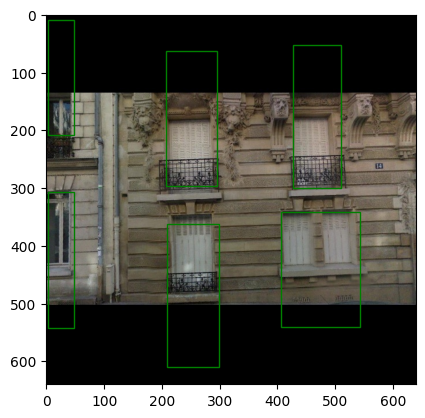

[0.41, 0.31625, 0.15833333333333338, 0.475625]
Rectangle(xy=(262.4, 202.4), width=101.333, height=304.4, angle=0)
[0.5841666666666666, 0.016875, 0.4125000000000001, 0.978125]
Rectangle(xy=(373.867, 10.8), width=264, height=626, angle=0)


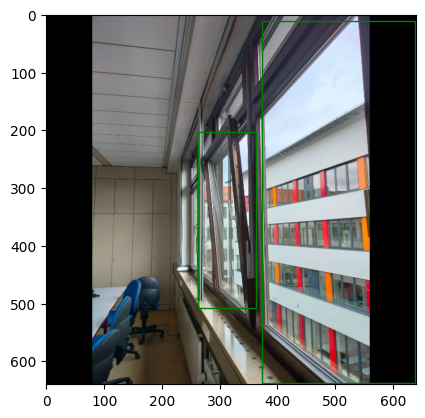

[0.23875432525951557, 0.473760092272203, 0.14338235294117646, 0.18771626297577854]
Rectangle(xy=(152.803, 303.206), width=91.7647, height=120.138, angle=0)
[0.393598615916955, 0.08967704728950404, 0.1066176470588236, 0.1251441753171857]
Rectangle(xy=(251.903, 57.3933), width=68.2353, height=80.0923, angle=0)


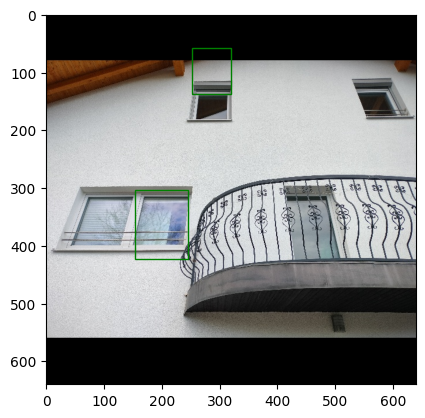

[0.08765859284890427, 0.3689446366782007, 0.8278546712802768, 0.5633650519031141]
Rectangle(xy=(56.1015, 236.125), width=529.827, height=360.554, angle=0)


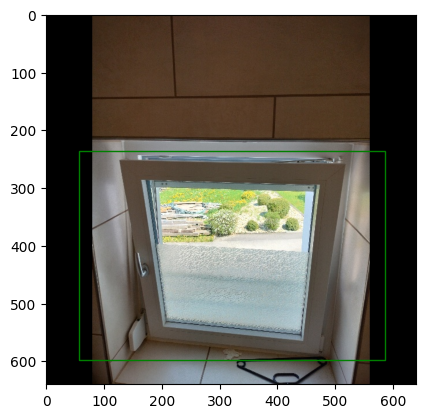

In [63]:
for images, targets in itertools.islice(train_loader, 5):
    images = list(image.to(device) for image in images)

    for i, annotations in enumerate(targets):
        image = images[i].cpu().numpy().transpose(1, 2, 0)  # Convert image tensor to numpy array

        # Create a figure and axes
        fig, ax = plt.subplots(1)

        # Display the image
        ax.imshow(image)

        for annotation in annotations:
            bbox = annotation['bbox']
            x, y, width, height = bbox

            # Create a Rectangle patch
            rect = plt.Rectangle((x*image.shape[1], y*image.shape[0]), width*image.shape[1], height*image.shape[0], linewidth=1, edgecolor='g', facecolor='none')

            # Add the rectangle to the axes
            ax.add_patch(rect)

            # Print bounding box coordinates
            print(bbox)
            print(rect)

        # Show the image with bounding boxes
        plt.show()

In [64]:
# Training loop
for epoch in range(num_epochs):
    
    # Training
    for images, targets in train_loader:
        images = list(image.to(device) for image in images)
        #ToDo change annotations bbox to boxes instead
        new_targets = []
        for annotations in targets:
            new_annotations = []
            for annotation in annotations:
                bbox = annotation['bbox']
                x, y, w, h = bbox
                if w > 0 and h > 0:
                    new_bbox = [x, y, x + w, y + h]  # Convert bbox to [x1, y1, x2, y2] format
                    new_annotation = {
                        'boxes': [new_bbox],
                        'labels': [annotation['category_id']],
                        'image_id': annotation['image_id'],
                        'area': annotation['area'],
                        'iscrowd': annotation['iscrowd']
                    }
                    new_annotations.append(new_annotation)
            new_targets.append(new_annotations)
        
        targets = [
            {
                k: torch.tensor(v).to(device) if isinstance(v, (list, tuple)) else v
                for k, v in t.items()
            }
            for annotations in new_targets
            for t in annotations
        ]
        for target in targets:
            target['boxes'] = target['boxes'].float()
        
        outputs = model(images, targets)
#         print(outputs)
        # Compute the total loss
        losses = sum(loss for loss in outputs.values())
        
        # Backward pass and optimization
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        
        # Update the learning rate
        lr_scheduler.step()
    # Print training status
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {losses.item():.4f}')      
torch.save(model.state_dict(), model_path)
print(f"Training complete. Model saved at {model_path}")
#         print(f'Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}], Loss: {losses.item():.4f}')

Epoch [1/20], Loss: 1.1846
Epoch [2/20], Loss: 0.7406
Epoch [3/20], Loss: 0.7895
Epoch [4/20], Loss: 0.9919
Epoch [5/20], Loss: 0.7572
Epoch [6/20], Loss: 1.3008
Epoch [7/20], Loss: 0.9512
Epoch [8/20], Loss: 0.7737
Epoch [9/20], Loss: 1.1258
Epoch [10/20], Loss: 0.7314
Epoch [11/20], Loss: 0.7537
Epoch [12/20], Loss: 0.7485
Epoch [13/20], Loss: 1.0423
Epoch [14/20], Loss: 0.8237
Epoch [15/20], Loss: 1.3441
Epoch [16/20], Loss: 0.7261
Epoch [17/20], Loss: 0.7193
Epoch [18/20], Loss: 0.9067
Epoch [19/20], Loss: 0.7130
Epoch [20/20], Loss: 0.8007
Training complete. Model saved at C:\Users\gokul\Desktop\CSIS_SS23\F_RCNN_dataset\F_RCNN_weightfile\FRCNN_model_4.pt


In [65]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

def convert_predictions(predictions, dataset):
    converted_predictions = []
    for image_idx, pred in enumerate(predictions):
        image_id = dataset['image_id']
        bbox = pred['boxes'].tolist()
        score = pred['scores'].tolist()
        category_id = pred['labels'].tolist()
        converted_predictions.extend([
            {
                'image_id': image_id,
                'category_id': category_id[i],
                'bbox': bbox[i],
                'score': score[i]
            }
            for i in range(len(bbox))
        ])
    return converted_predictions



def evaluate_predictions(predictions, val_annotations_path):
    # Create a COCO object for the validation annotations
    coco_gt = COCO(val_annotations_path)

    # Convert predictions to COCO format
    converted_predictions = convert_predictions(predictions)

    # Load predictions into COCO object
    coco_dt = coco_gt.loadRes(converted_predictions)

    # Create a COCOeval object and run evaluation
    coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

    return coco_eval

In [78]:
 #Validation
predictions = []
model.eval()
for epoch in range(num_epochs):
    with torch.no_grad():
        total_loss = 0.0
        for images, targets in val_loader:
            images = list(image.to(device) for image in images)
            new_targets = []
            for annotations in targets:
                new_annotations = []
                for annotation in annotations:
                    bbox = annotation['bbox']
                    x, y, w, h = bbox
                    if w > 0 and h > 0:
                        new_bbox = [x, y, x + w, y + h]  # Convert bbox to [x1, y1, x2, y2] format
                        new_annotation = {
                            'boxes': [new_bbox],
                            'labels': [annotation['category_id']],
                            'image_id': annotation['image_id'],
                            'area': annotation['area'],
                            'iscrowd': annotation['iscrowd']
                        }
                        new_annotations.append(new_annotation)
                new_targets.append(new_annotations)

            targets = [
                {
                    k: torch.tensor(v).to(device) if isinstance(v, (list, tuple)) else v
                    for k, v in t.items()
                }
                for annotations in new_targets
                for t in annotations
        ]
        for target in targets:
            target['boxes'] = target['boxes'].float()

        # Forward pass
        outputs = model(images, targets)
        
        print(f'Epoch [{epoch+1}/{num_epochs}]')       

        

RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same

C:\Users\gokul\.conda\envs\new_env_csis\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


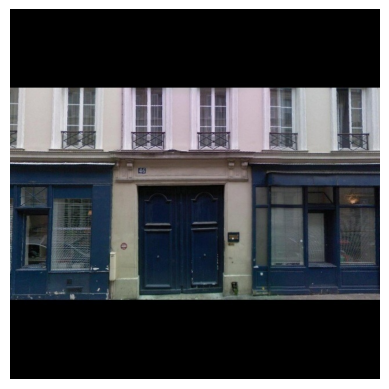

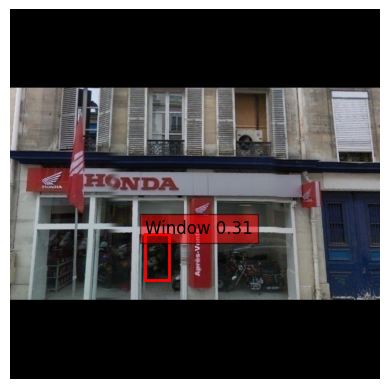

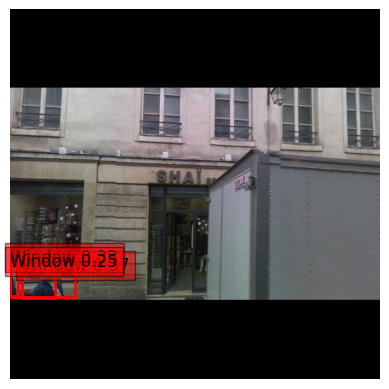

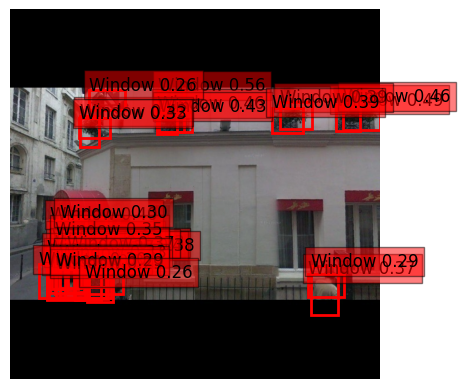

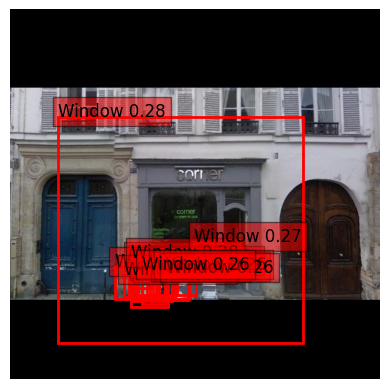

...

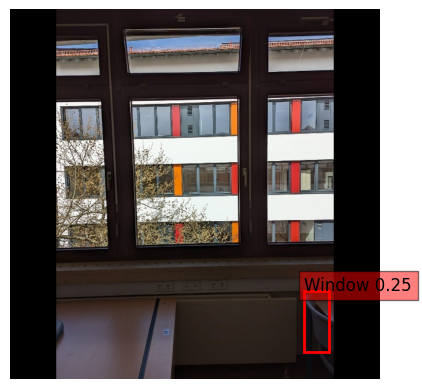

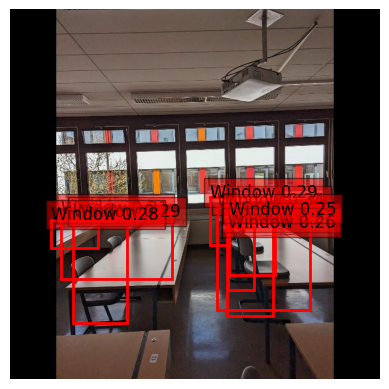

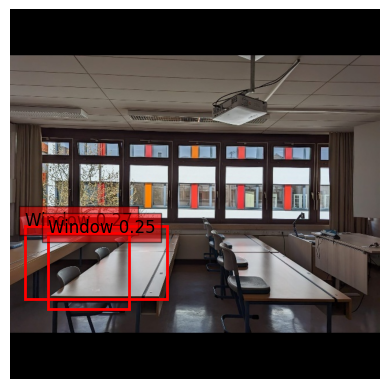

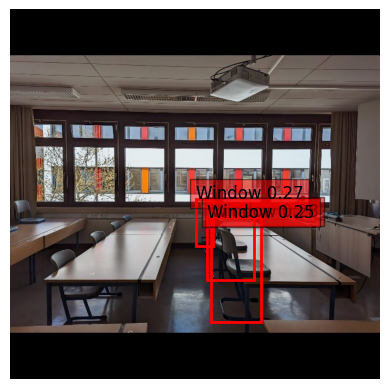

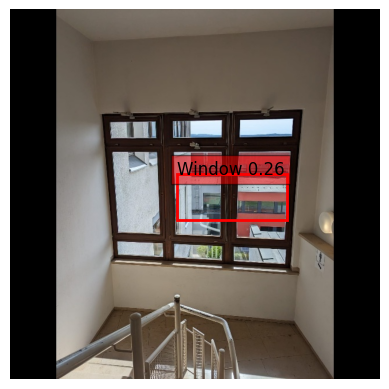

In [66]:
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F
import matplotlib.pyplot as plt
import os
from PIL import Image
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
# Define the paths
weights_path = r"C:/Users/gokul/Desktop/CSIS_SS23/F_RCNN_dataset/F_RCNN_weightfile/FRCNN_model_4.pt"
sample_images_dir = r"C:\Users\gokul\Desktop\CSIS_SS23\F_RCNN_dataset\test"

# Load the model
model = fasterrcnn_resnet50_fpn(pretrained=False)
num_classes = 2  # Assuming you have two classes: window and background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# Load the trained weights
model.load_state_dict(torch.load(weights_path))
model.eval()
target_size = (224, 224)

# Iterate through the sample images
for image_name in os.listdir(sample_images_dir):
    image_path = os.path.join(sample_images_dir, image_name)
    image = Image.open(image_path).convert("RGB")
    image.resize(target_size)
    # Preprocess the image
    image_tensor = F.to_tensor(image)

    # Make predictions
    with torch.no_grad():
        predictions = model([image_tensor])

    # Extract the predicted boxes, labels, and scores
    boxes = predictions[0]["boxes"]
    labels = predictions[0]["labels"]
    scores = predictions[0]["scores"]

    # Plot the image with bounding boxes and labels
    fig, ax = plt.subplots()
    ax.imshow(image)

    for box, label, score in zip(boxes, labels, scores):
        if score > 0.25:  # Adjust the threshold as needed
            # Draw bounding box
            box = box.tolist()
            rect = plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1],
                                 fill=False, edgecolor="red", linewidth=2)
            ax.add_patch(rect)

            # Add label
            class_name = "Window" if label == 1 else "Background"
            plt.text(box[0], box[1], f"{class_name} {score:.2f}", fontsize=12,
                     bbox=dict(facecolor="red", alpha=0.5))
#     plt.imshow(image)
    plt.axis("off")
    plt.show()


In [70]:
def apply_nms(orig_prediction, iou_thresh=0.3):
    
    # torchvision returns the indices of the bboxes to keep
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

# function to convert a torchtensor back to PIL image
def torch_to_pil(img):
    return transforms.ToPILImage()(img).convert('RGB')

In [71]:
img, target = train_dataset[569]
# put the model in evaluation mode
# model = fasterrcnn_resnet50_fpn(pretrained=True)
# num_classes = 2  # Assuming you have two classes: window and background
# in_features = model.roi_heads.box_predictor.cls_score.in_features
# model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# Load the trained weights
model.load_state_dict(torch.load(weights_path))
model.eval()
with torch.no_grad():
    prediction = model([img])[0]
    
print('predicted #boxes: ', len(prediction['labels']))

AttributeError: shape

In [72]:
def plot_img_bbox(img, target):
    # plot the image and bboxes
    # Bounding boxes are defined as follows: x-min y-min width height
    fig, a = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    a.imshow(img)
    for box in (target['boxes']):
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        # Draw the bounding box on top of the image
        a.add_patch(rect)
    plt.show()

In [73]:
print('MODEL OUTPUT')
plot_img_bbox(torch_to_pil(img), prediction)

MODEL OUTPUT


TypeError: pic should be Tensor or ndarray. Got <class 'PIL.Image.Image'>.

NMS APPLIED MODEL OUTPUT


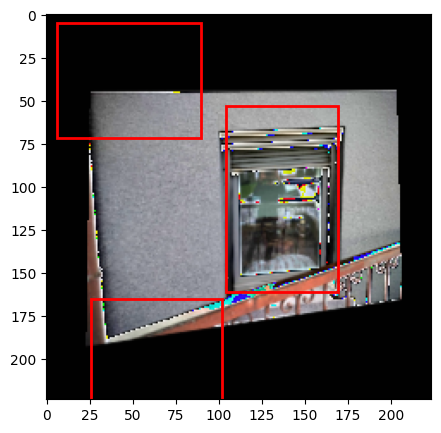

In [129]:
nms_prediction = apply_nms(prediction, iou_thresh=0.001)
print('NMS APPLIED MODEL OUTPUT')
plot_img_bbox(torch_to_pil(img), nms_prediction)

In [ ]:
#Redundant below this

In [56]:
# # Forward pass
# outputs = model(images, targets)

# # Extract predicted bounding boxes, labels, and scores from the outputs
# pred_boxes = outputs['boxes']
# pred_labels = outputs['labels']
# pred_scores = outputs['scores']

# # Compute the classification loss (e.g., cross-entropy loss)
# classification_loss = classification_criterion(pred_labels, targets['labels'])

# # Compute the regression loss (e.g., smooth L1 loss)
# regression_loss = regression_criterion(pred_boxes, targets['boxes'])

# # Compute the total loss by summing the classification and regression losses
# total_loss = classification_loss + regression_loss



In [1]:
model.load_state_dict(torch.load(r"C:\Users\gokul\Desktop\CSIS_SS23\F_RCNN_dataset\F_RCNN_weightfile\FRCNN_model.pt"))
with torch.no_grad():
    for images, targets in val_loader:
        # ...

        # Get predicted bounding boxes and labels
        pred_boxes = outputs[0]['boxes']
        pred_labels = outputs[0]['labels']

        for image, boxes, labels in zip(images, pred_boxes, pred_labels):
            image = image.permute(1, 2, 0).cpu().numpy()  # Move image tensor to CPU and convert to numpy array
            image = (image * 255).astype('uint8')  # Rescale image from [0, 1] to [0, 255]

            # Create figure and axes
            fig, ax = plt.subplots(1)
            ax.imshow(image)

            # Check the dimensions of boxes and labels
            if boxes.dim() == 1:
                boxes = boxes.unsqueeze(0)
                labels = labels.unsqueeze(0)

            # Iterate over each predicted bounding box
            for box, label in zip(boxes, labels):
                xmin, ymin, xmax, ymax = box.cpu().numpy()  # Move box tensor to CPU and convert to numpy array
                width = xmax - xmin
                height = ymax - ymin

                # Convert normalized coordinates to pixel coordinates
                img_height, img_width = image.shape[:2]
                xmin_pixel = int(xmin * img_width)
                ymin_pixel = int(ymin * img_height)
                width_pixel = int(width * img_width)
                height_pixel = int(height * img_height)

                # Create a rectangle patch
                rect = patches.Rectangle((xmin_pixel, ymin_pixel), width_pixel, height_pixel, linewidth=2, edgecolor='r', facecolor='none')

                # Add the rectangle patch to the axes
                ax.add_patch(rect)

                # Add label text
                plt.text(xmin_pixel, ymin_pixel, f'Class {label}', fontsize=8, color='r')

            # Show the plot for the current image
            plt.show()

NameError: name 'model' is not defined